In [1]:
import sys
from pathlib import Path

script_path = Path.cwd().parent / 'gpr'
sys.path.append(str(script_path))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

import seaborn as sb
import corner

import anal_helpers as anal

import post_anal as pa


from aquarel import load_theme
theme = (
        load_theme("gruvbox_dark")
        .set_font("serif")
        .set_grid(True, width=0.2)
        )

theme.apply()

# old stuff

In [16]:
eos_file = "/home/sam/thesis/code/results/eos_samples/old_SE_10ns_1/SE_10ns_1_eos.npy"
eos = np.load(eos_file)

mr_file = "/home/sam/thesis/code/results/tov_res/old_SE_10ns_1/SE_10ns_1_tidal.npy"
mr = np.load(mr_file)
r = mr[0]
m = mr[1]
tide = mr[2]
press_cent = mr[3]

edens = eos[0]
press = eos[1]
cs2 = eos[2]

In [17]:
filepath = "/home/sam/thesis/code/results/nmma/old_SE_10ns_1/GW170817_samples.parquet"

In [18]:
df = pd.read_parquet(filepath)

In [19]:
df["EOS"] = np.int64(np.floor(df["EOS"]))

In [20]:
df

,chirp_mass,mass_ratio,a_1,a_2,tilt_1,tilt_2,phi_12,phi_jl,luminosity_distance,cos_theta_jn,psi,phase,geocent_time,EOS
0,1.197313,0.884563,0.025587,0.016213,1.813921,2.531744,4.714963,3.291274,40.392490,-0.912148,3.095519,1.316209,1.187009e+09,7933
1,1.197329,0.816835,0.047455,0.020644,2.049946,1.133639,6.130566,0.325919,45.382392,-0.963848,1.646706,3.328569,1.187009e+09,4942
2,1.197451,0.817194,0.027839,0.002163,1.742535,0.468510,5.313243,0.198937,30.060942,-0.552477,0.164227,5.258109,1.187009e+09,1628
3,1.197396,0.912910,0.028584,0.016782,2.818172,0.764094,5.373189,0.571774,49.110183,-0.990868,1.530361,3.356675,1.187009e+09,6796
4,1.197548,0.874658,0.000086,0.002858,1.797877,1.726787,1.070928,0.783620,46.876586,-0.971361,3.065071,5.267626,1.187009e+09,4555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4819,1.197538,0.585693,0.043432,0.047709,0.743524,0.484679,3.254848,0.115949,37.777528,-0.792760,0.391560,5.309136,1.187009e+09,9583
4820,1.197459,0.722183,0.033186,0.039347,1.705853,0.878096,5.212123,3.923869,36.994887,-0.781923,0.248834,5.267974,1.187009e+09,9714
4821,1.197437,0.758927,0.009494,0.001653,1.045604,2.358857,5.268792,0.214717,21.643213,-0.463777,0.103282,5.146952,1.187009e+09,7785
4822,1.197602,0.577095,0.047833,0.047772,0.086458,1.013231,4.902834,5.817384,44.234980,-0.929512,0.366172,5.460060,1.187009e+09,4878


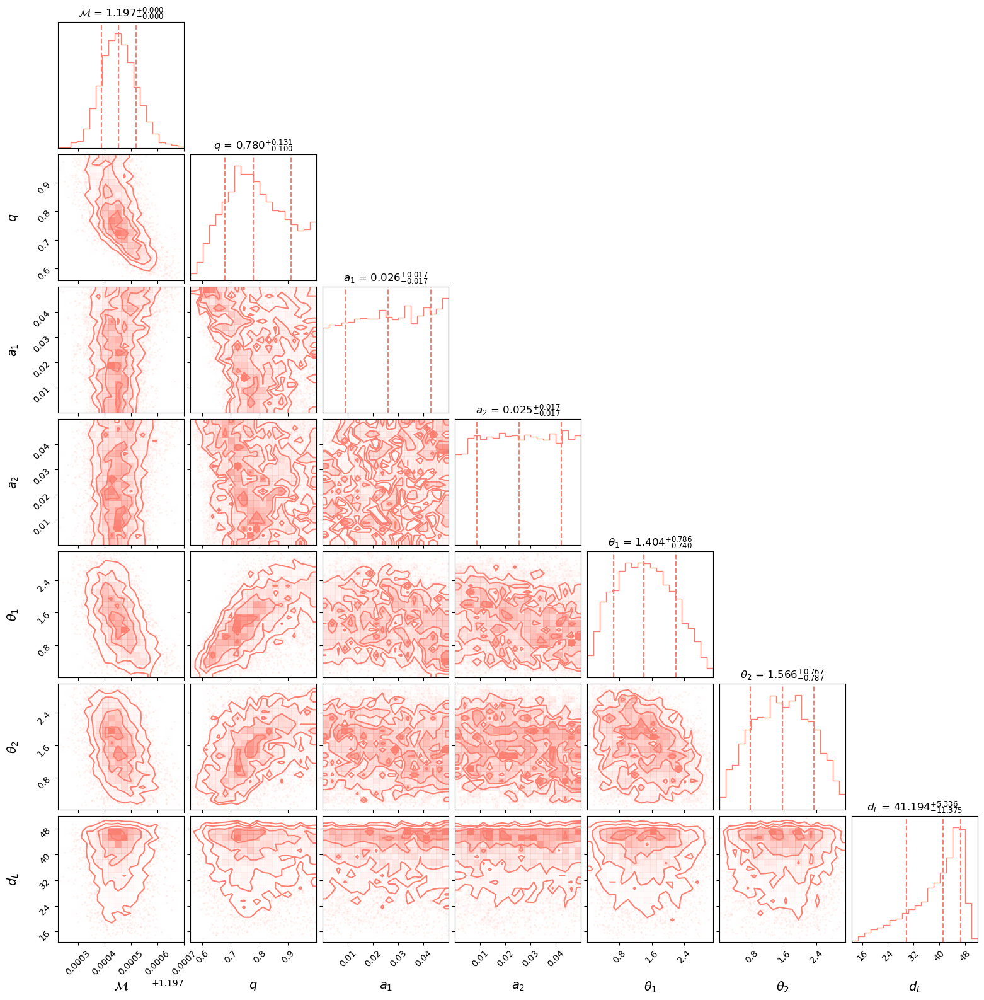

In [21]:
params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]

figure = corner.corner(
    df[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)

plt.show()

In [22]:
valid_eos = []
for i in df["EOS"]:
    valid_eos.append(i)

In [ ]:
m_14 = []
r_14 = []
pc_14 = []
ec_14 = []

for i in range(len(r)):
    valid_mask = ~np.isnan(m[i]) & ~np.isnan(r[i])
    m_valid = m[i][valid_mask]
    r_valid = r[i][valid_mask]
    pc_valid = press_cent[i][valid_mask]
    edens_valid = edens[i]
    press_valid = press[i]

    if len(m_valid) > 1 and (np.min(m_valid) <= 1.4 <= np.max(m_valid) or np.max(m_valid) <= 1.4 <= np.min(m_valid)): # if eos reaches 1.4
        r_interp = np.interp(1.4, m_valid, r_valid)
        r_14.append(r_interp)
        pc_interp = np.interp(1.4, m_valid, pc_valid)
        pc_14.append(pc_interp)
        ec_interp = np.interp(pc_interp, press_valid, edens_valid)
        ec_14.append(ec_interp)
    else:
        r_14.append(np.nan)
        pc_14.append(np.nan)
        ec_14.append(np.nan)
        
r_14 = np.asarray(r_14)
pc_14 = np.asarray(pc_14)
ec_14 = np.asarray(ec_14)

df["r_1.4"] = r_14[valid_eos]
df["pc_1.4"] = pc_14[valid_eos]
df["ec_1.4"] = ec_14[valid_eos]


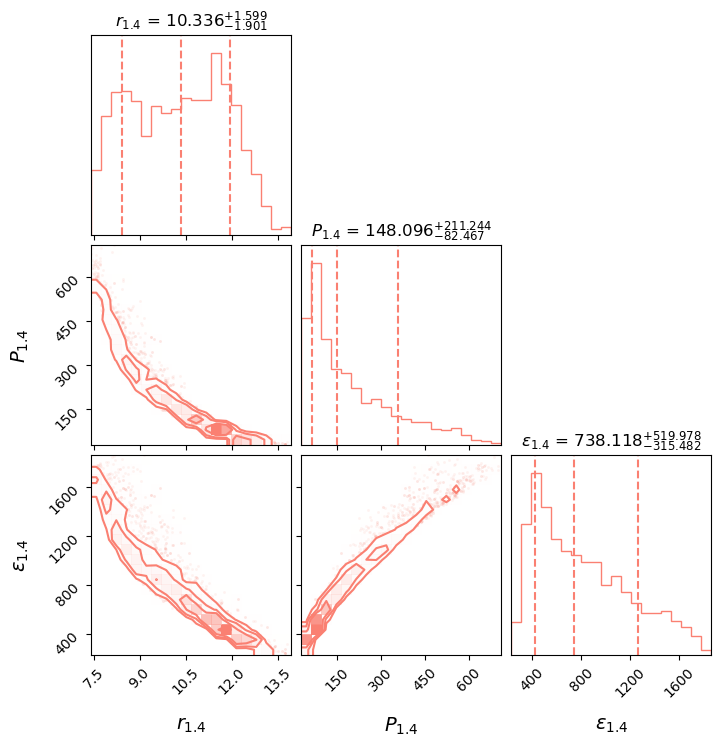

In [ ]:
params_to_plot = [
   "r_1.4", "pc_1.4", "ec_1.4"
]

labels = [
    r"$r_{1.4}$", r"$P_{1.4}$", r"$\epsilon_{1.4}$"
]

df_clean = df[params_to_plot].dropna()

figure = corner.corner(
    df_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.title("")
plt.show()

$$M_c = \frac{(m_1 m_2)^{3/5}}{(m_1 + m_2)^{1/5}}$$

$$q = m_1/m_2$$

$$M = m_1 + m_2$$

$$\mu = \frac{m_1m_2}{M}$$

$$m_1 = q m_2$$

$$m_1 m_2 = qm_2*m_2$$

$$M = m_1 + m_2 = q m_2 + m_2 = (q + 1) m_2$$

$$M_c = \frac{(q m_2^2)^{3/5}}{M^{1/5}}$$
$$M_c = \frac{(q m_2^2)^{3/5}}{((q + 1) m_2)^{1/5}}$$
$$M_c = \frac{(q^{3/5} m_2^{6/5})}{((q + 1)^{1/5} m_2^{1/5})}$$
$$M_c \frac{(q+1)^{1/5}}{q^{3/5}} = m_2^{6/5-1/5}$$
$$m_2 = M_c \frac{(q+1)^{1/5}}{q^{3/5}}$$
$$m_1 = q m_2 = q M_c \frac{(q+1)^{1/5}}{q^{3/5}} = M_c (q+1)^{1/5} q^{2/5}$$


chirp_mass * (1 + mass_ratio) ** 1.2 / mass_ratio ** 0.6:

$$M = M_c  \frac{(1+q)^{6/5}} {q^{3/5}}$$


$$m_1 + m_2 = M_c (q+1)^{1/5} q^{2/5} + M_c \frac{(q+1)^{1/5}}{q^{3/5}} = M_c (q+1)^{1/5} (\frac{1}{q^{3/5}} + q^{2/5}) = M_c(q+1)^{1/5}\frac{q+1}{q^{3/5}} = M_c \frac{(q+1)^{6/5}}{q^{3/5}}$$

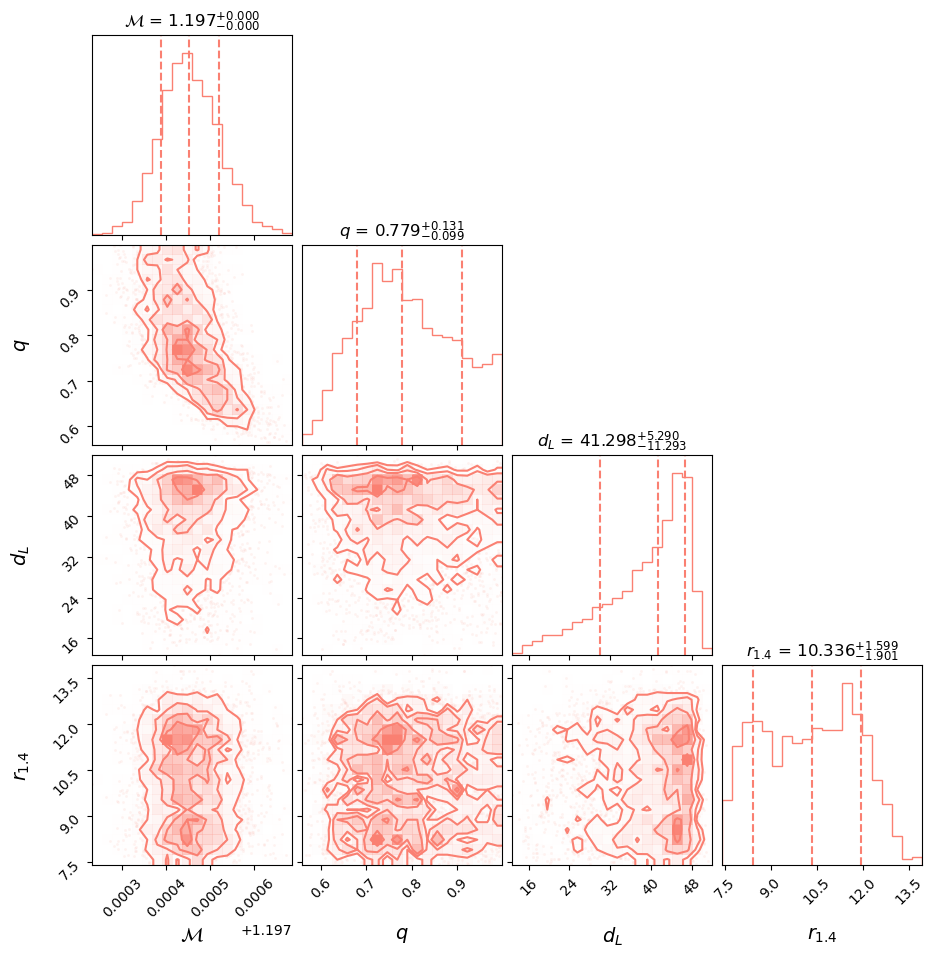

In [12]:
params_to_plot = [
    "chirp_mass", "mass_ratio", "luminosity_distance", "r_1.4"
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$d_L$", r"$r_{1.4}$"
]

df_clean = df[params_to_plot].dropna()

figure = corner.corner(
    df_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)

plt.show()

In [18]:
n = anal.get_n_test(10, 200)
n_ceft, _, cs2_l, cs2_u = anal.get_ceft_cs2()

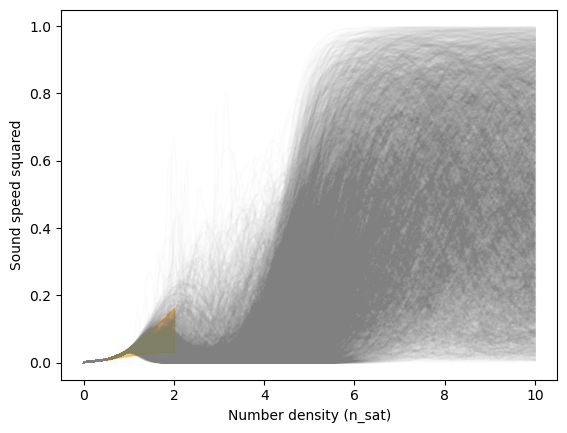

In [19]:
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(n, eos[2][i], color='grey', alpha=0.02)
plt.fill_between(n_ceft, cs2_l, cs2_u, color='orange', alpha=0.6, label=r"$\chi_{EFT}$")
plt.xlabel("Number density (n_sat)")
plt.ylabel("Sound speed squared")
plt.show()


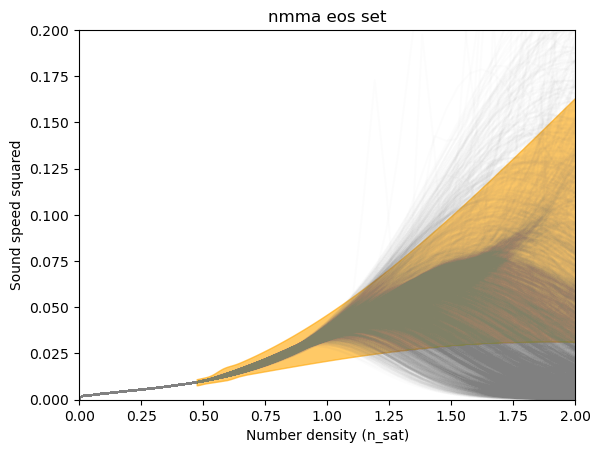

In [20]:
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(n, eos[2][i], color='grey', alpha=0.02)
plt.fill_between(n_ceft, cs2_l, cs2_u, color='orange', alpha=0.6, label=r"$\chi_{EFT}$")
plt.xlabel("Number density (n_sat)")
plt.ylabel("Sound speed squared")
plt.ylim(0,0.2)
plt.xlim(0,2)
plt.title("nmma eos set")
plt.show()


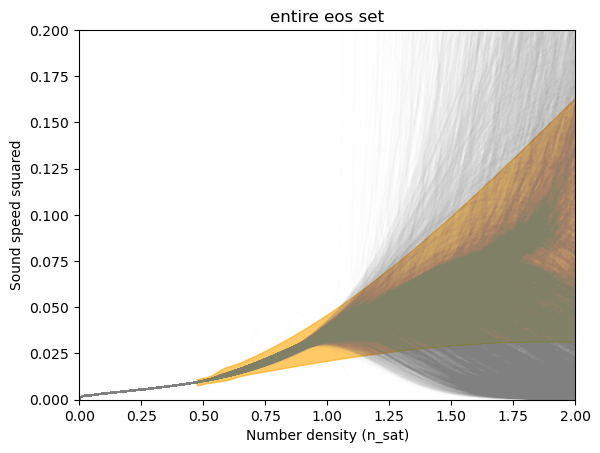

In [21]:
for i in range(len(eos[0])):
    plt.plot(n, eos[2][i], color='grey', alpha=0.01)
plt.fill_between(n_ceft, cs2_l, cs2_u, color='orange', alpha=0.6, label=r"$\chi_{EFT}$")
plt.xlabel("Number density (n_sat)")
plt.ylabel("Sound speed squared")
plt.ylim(0,0.2)
plt.xlim(0,2)
plt.title("entire eos set")
plt.show()


In [45]:
_, e, el, eu = anal.get_ceft_e()
_, p, pl, pu = anal.get_ceft_p()

In [ ]:
from aquarel import load_theme
theme = (
        load_theme("gruvbox_dark")
        .set_font("serif")
        .set_grid(True, width=0.2)
        )


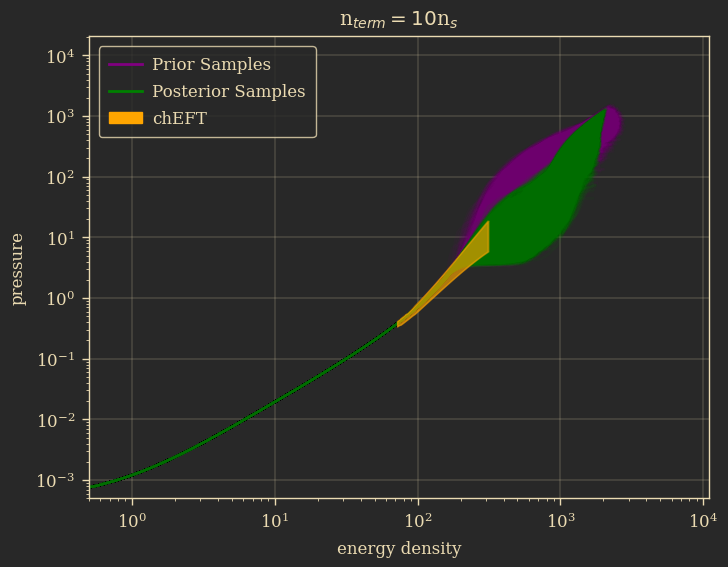

In [120]:
theme.set_legend(location="upper left")
theme.apply()

plt.figure(figsize=(8, 6)) 
for i in range(len(eos[0])):
    if i not in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='purple', alpha=0.05)
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='green', alpha=0.05)

plt.fill_between(el, pl, pu, color = "orange", alpha=0.4, zorder=10)
plt.fill_between(eu, pl, pu, color = "orange", alpha=0.4, zorder=10)

legend_elements = [
    Line2D([0], [0], color='purple', lw=2, alpha=1, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, alpha=1, label='Posterior Samples'),
     Patch(facecolor='orange', edgecolor='orange', alpha=1, label='chEFT')
]
handles, labels = plt.gca().get_legend_handles_labels()
all_handles = handles + legend_elements
all_labels = labels + [item.get_label() for item in legend_elements]

plt.yscale("log")
plt.xscale("log")
plt.xlabel("energy density")
plt.ylabel("pressure")
plt.title(r"n$_{term} = 10$n$_s$")
plt.xlim(0.5,)
plt.ylim(5e-4,)
plt.legend(handles=all_handles, labels=all_labels)
theme.apply_transforms()
plt.show()


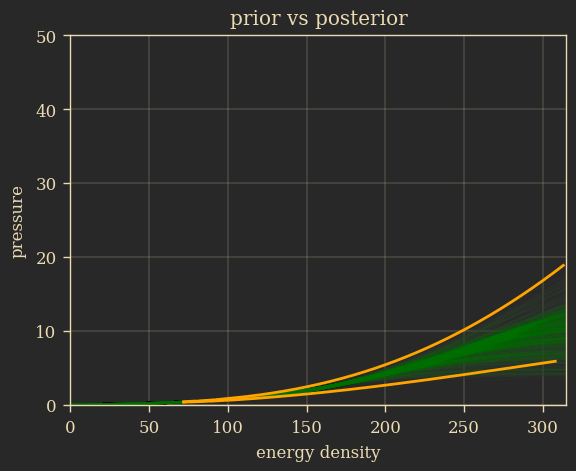

In [82]:
theme.apply()
for i in range(500):
    plt.plot(eos[0][i], eos[1][i], color='purple', alpha=0.05)
for i in range(500):
    if i in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='green', alpha=0.05)
plt.plot(el, pl, color='orange')
plt.plot(eu, pu, color='orange', label='chEFT')
plt.xlabel("energy density")
plt.ylabel("pressure")
plt.title("prior vs posterior")
plt.xlim(0,315)
plt.ylim(0,50)
theme.apply_transforms()
plt.show()

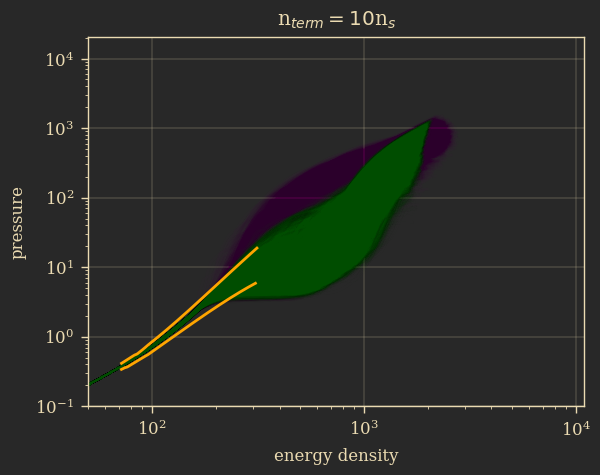

In [118]:
theme.apply()
for i in range(len(eos[0])):
    plt.plot(eos[0][i], eos[1][i], color='purple', alpha=0.01)
for i in range(len(eos[0])):
    if i in df["EOS"]:
        plt.plot(eos[0][i], eos[1][i], color='green', alpha=0.02)
plt.plot(el, pl, color='orange')
plt.plot(eu, pu, color='orange', label='chEFT')
plt.yscale("log")
plt.xscale("log")
plt.xlabel("energy density")
plt.ylabel("pressure")
plt.title(r"n$_{term} = 10$n$_s$")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()

# SE

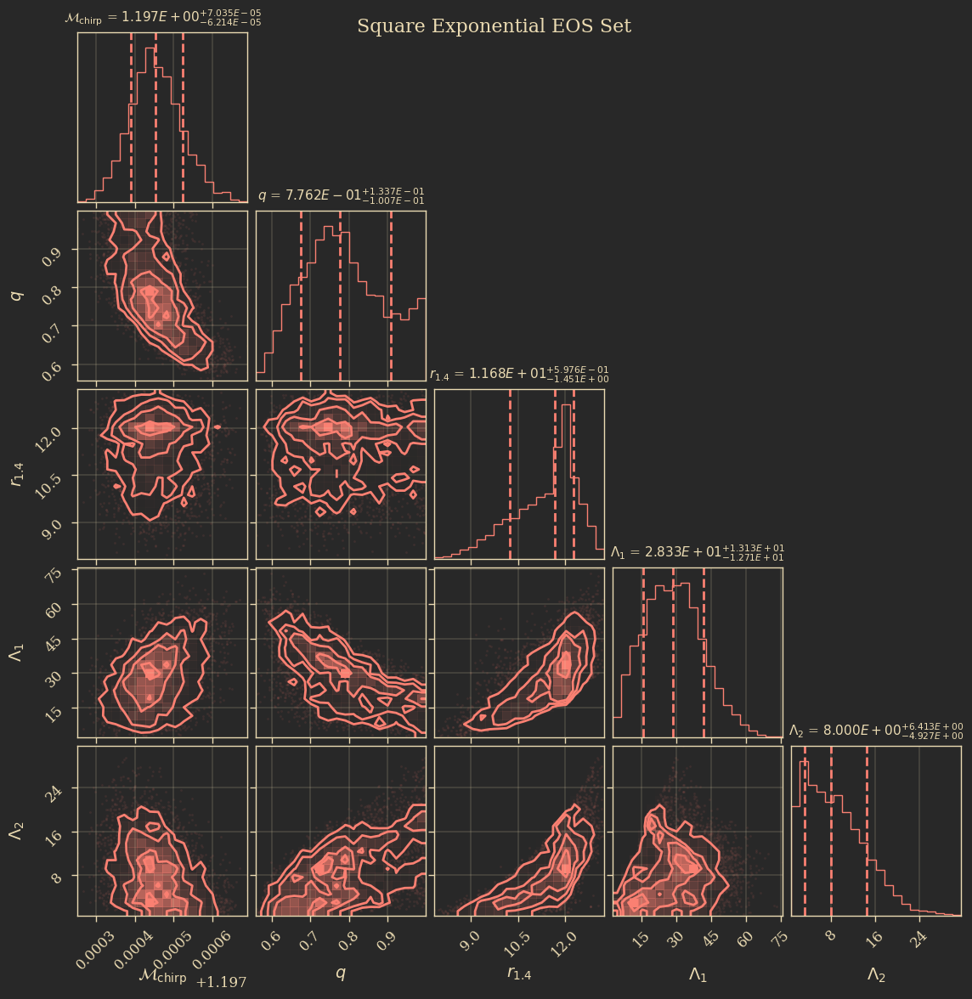

In [20]:
params_to_plot = [
   "chirp_mass", "mass_ratio", "r_1.4", "tide1", "tide2"
]

labels = [
    r"$\mathcal{M}_{\text{chirp}}$", r"$q$", r"$r_{1.4}$", r"${\Lambda}_1$", r"${\Lambda}_2$"
]

df_se_clean = df_se[params_to_plot].dropna()

figure = corner.corner(
    df_se_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 11},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3E",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Square Exponential EOS Set", fontsize=16)

plt.show()
theme.apply_transforms()

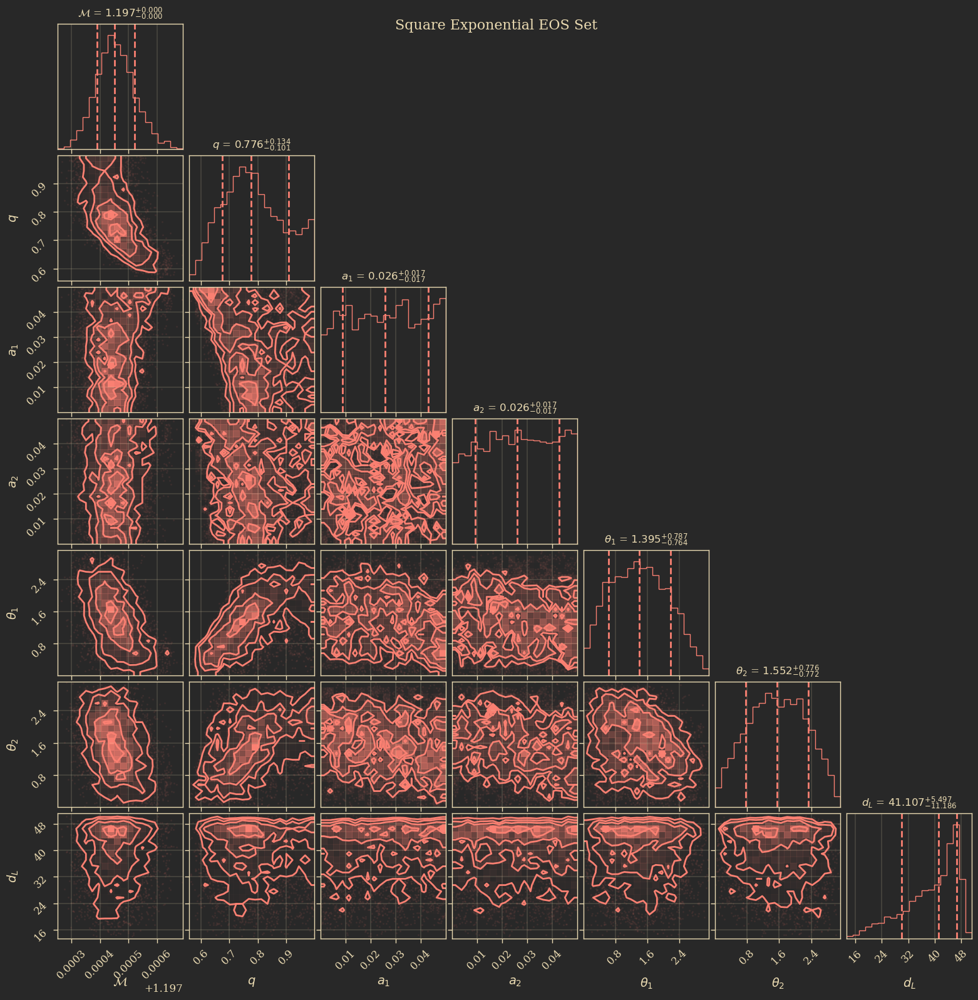

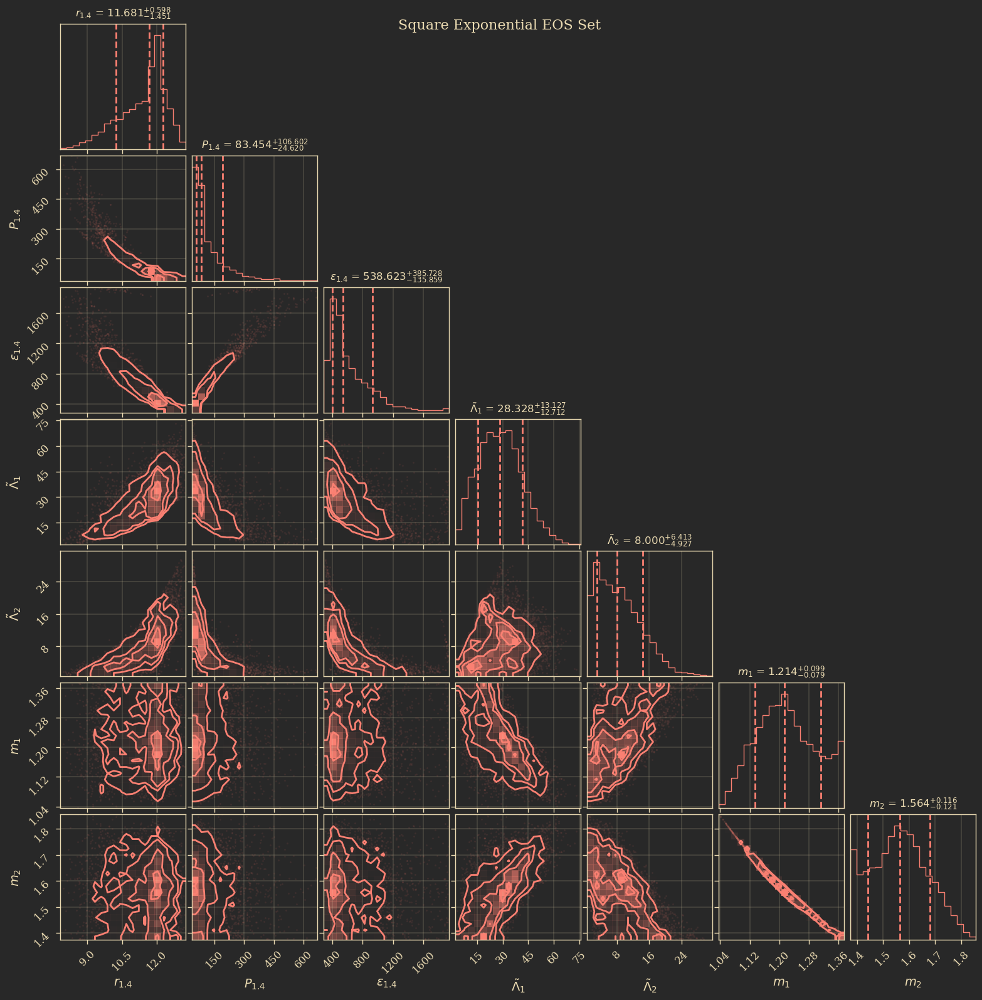

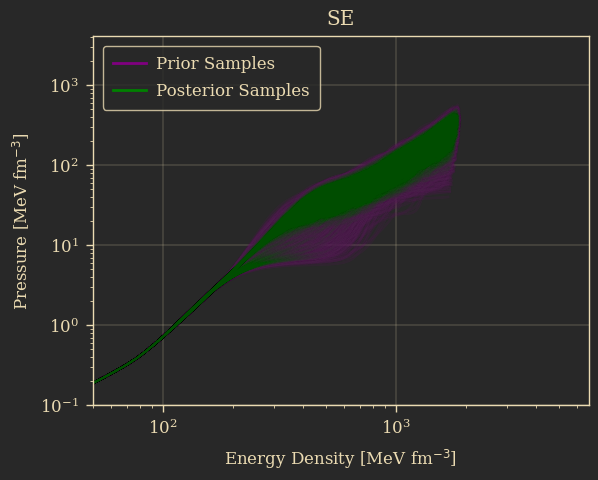

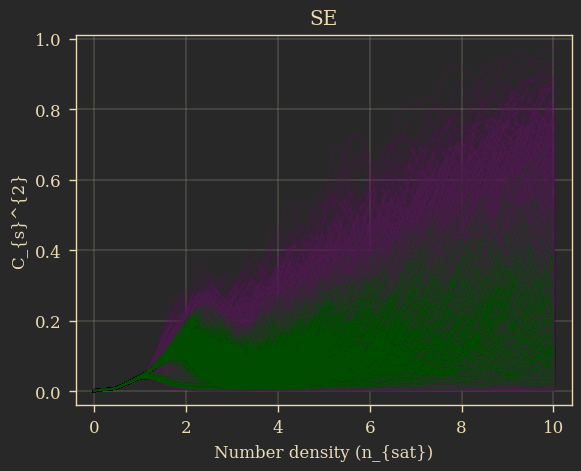

In [2]:
df_se = pa.load_results('SE_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]

figure = corner.corner(
    df_se[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Square Exponential EOS Set", fontsize=16)
plt.show()
theme.apply_transforms()

params_to_plot = [
   "r_1.4", "pc_1.4", "ec_1.4", "tide1", "tide2", "m1", "m2"
]

labels = [
    r"$r_{1.4}$", r"$P_{1.4}$", r"$\epsilon_{1.4}$", r"$\tilde{\Lambda}_1$", r"$\tilde{\Lambda}_2$", r"$m_1$", r"$m_2$"
]

df_se_clean = df_se[params_to_plot].dropna()

figure = corner.corner(
    df_se_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Square Exponential EOS Set", fontsize=16)

plt.show()
theme.apply_transforms()


eos_se, mr_se = pa.load_eos_data('SE_10ns_1')

num_eos = 2000
for i in range(num_eos):
    plt.plot(eos_se[0][i], eos_se[1][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_se["EOS"]:
        plt.plot(eos_se[0][i], eos_se[1][i], color='green', alpha=0.02)

legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"SE")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()
theme.apply_transforms()

n = anal.get_n_test(10, 200)
for i in range(num_eos):
    plt.plot(n, eos_se[2][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_se["EOS"]:
        plt.plot(n, eos_se[2][i], color='green', alpha=0.02)
legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"SE")
plt.show()
theme.apply_transforms()

# GE

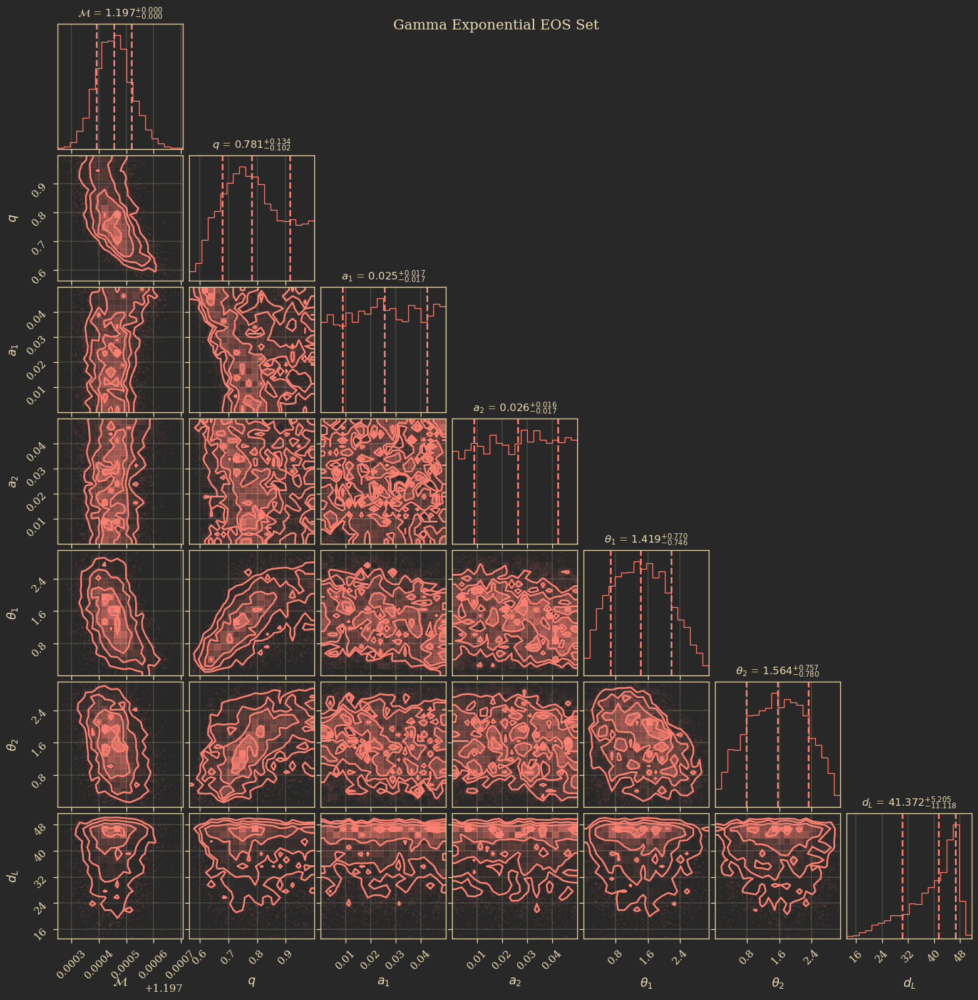

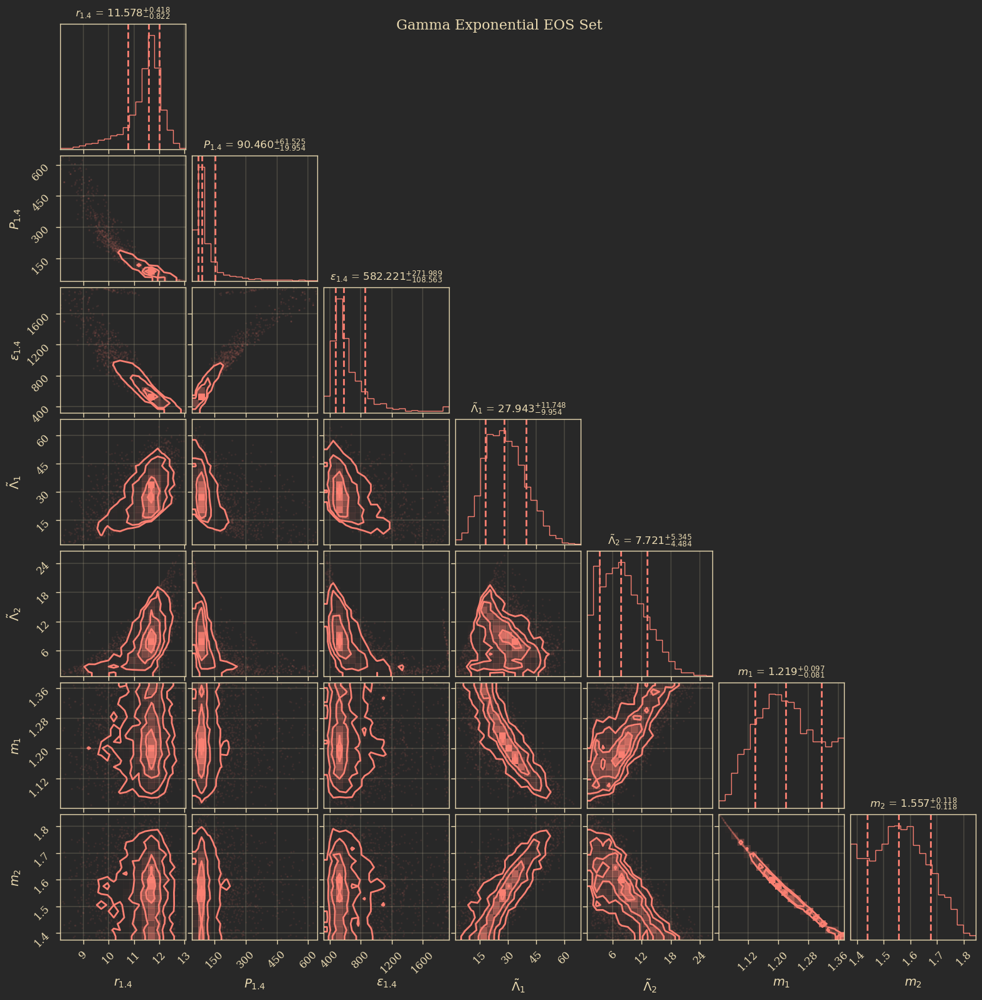

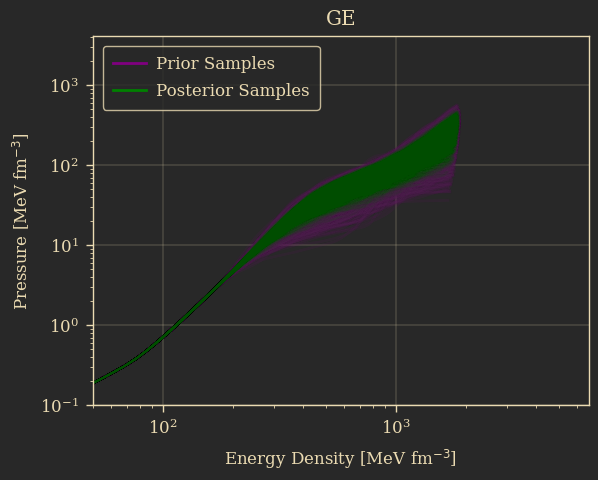

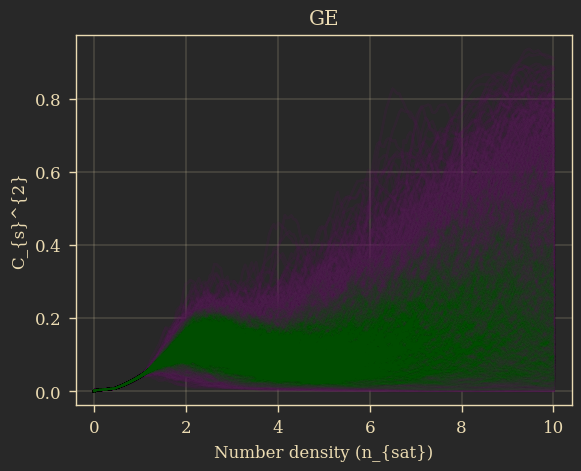

In [6]:
df_ge = pa.load_results('GE_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]


figure = corner.corner(
    df_ge[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Gamma Exponential EOS Set", fontsize=16)
plt.show()
theme.apply_transforms()
params_to_plot = [
   "r_1.4", "pc_1.4", "ec_1.4", "tide1", "tide2", "m1", "m2"
]

labels = [
    r"$r_{1.4}$", r"$P_{1.4}$", r"$\epsilon_{1.4}$", r"$\tilde{\Lambda}_1$", r"$\tilde{\Lambda}_2$", r"$m_1$", r"$m_2$"
]

df_ge_clean = df_ge[params_to_plot].dropna()


figure = corner.corner(
    df_ge_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Gamma Exponential EOS Set", fontsize=16)
plt.show()
theme.apply_transforms()


eos_ge, mr_ge = pa.load_eos_data('GE_10ns_1')

num_eos = 2000

for i in range(num_eos):
    plt.plot(eos_ge[0][i], eos_ge[1][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_ge["EOS"]:
        plt.plot(eos_ge[0][i], eos_ge[1][i], color='green', alpha=0.02)

legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"GE")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()
theme.apply_transforms()

n = anal.get_n_test(10, 200)
for i in range(num_eos):
    plt.plot(n, eos_ge[2][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_ge["EOS"]:
        plt.plot(n, eos_ge[2][i], color='green', alpha=0.02)
legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"GE")
plt.show()
theme.apply_transforms()

# M32

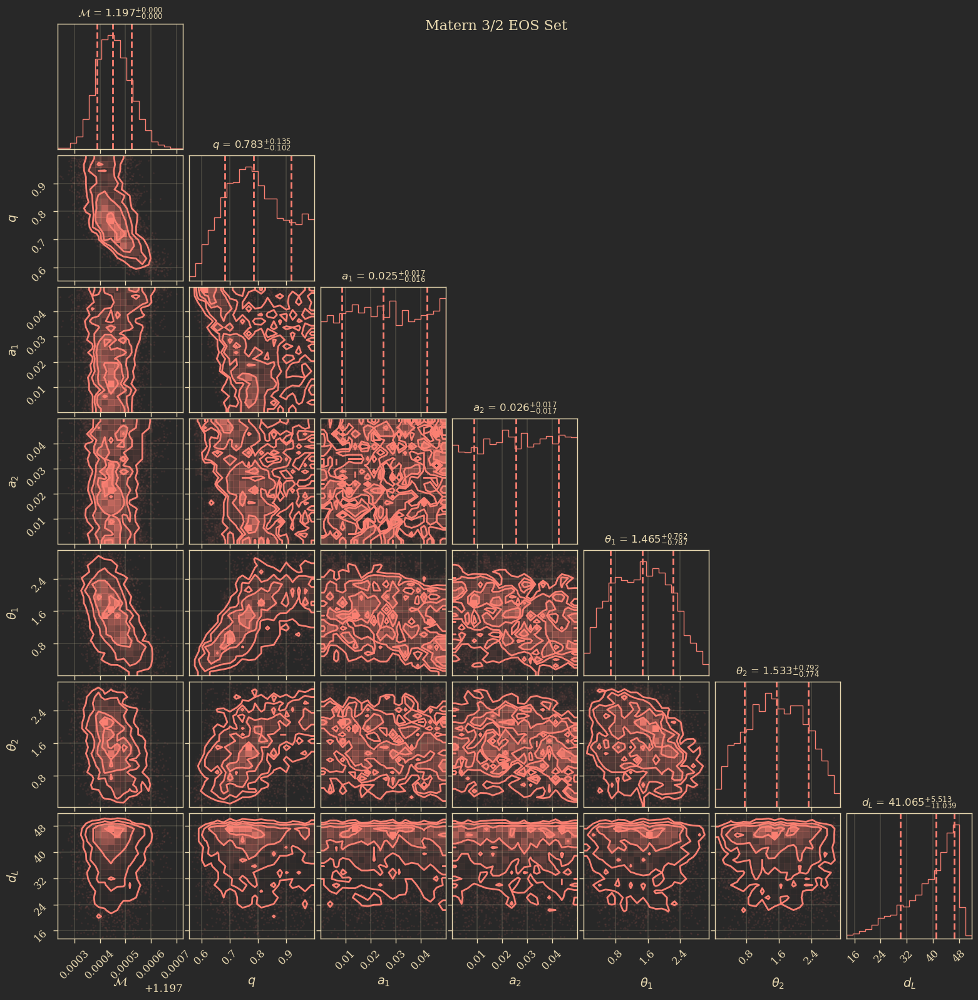

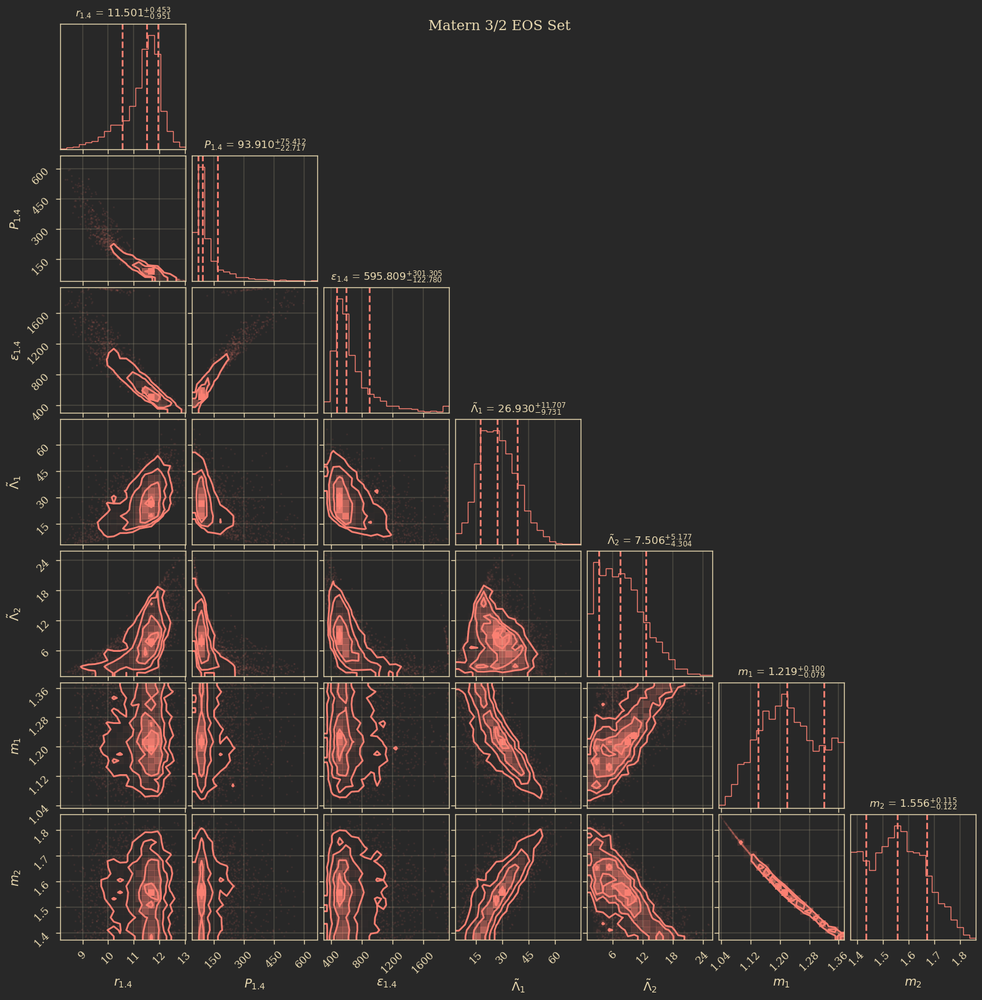

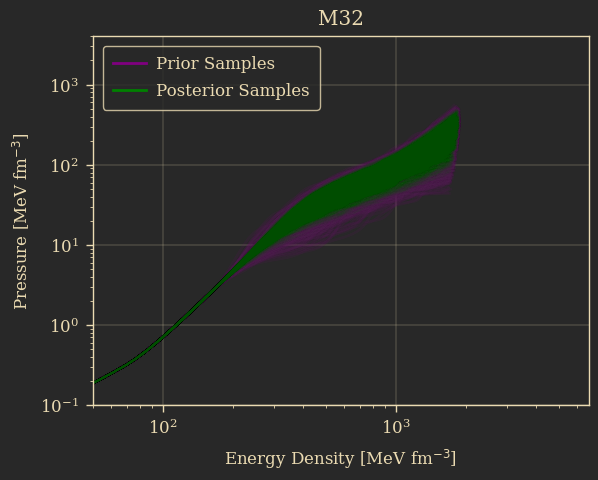

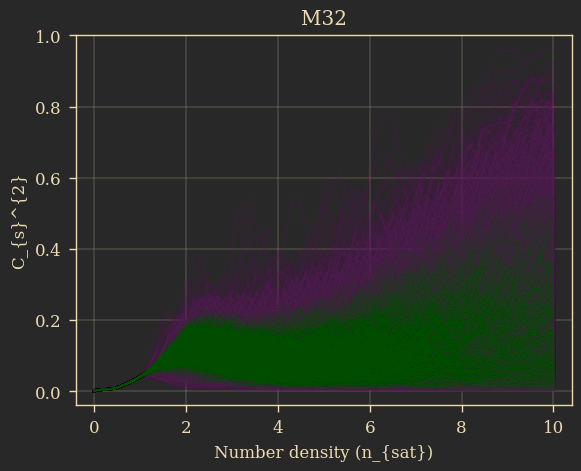

In [7]:
df_m32 = pa.load_results('M32_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]

theme.apply()
figure = corner.corner(
    df_m32[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Matern 3/2 EOS Set", fontsize=16)
plt.show()

params_to_plot = [
   "r_1.4", "pc_1.4", "ec_1.4", "tide1", "tide2", "m1", "m2"
]

labels = [
    r"$r_{1.4}$", r"$P_{1.4}$", r"$\epsilon_{1.4}$", r"$\tilde{\Lambda}_1$", r"$\tilde{\Lambda}_2$", r"$m_1$", r"$m_2$"
]

df_m32_clean = df_m32[params_to_plot].dropna()

theme.apply()
figure = corner.corner(
    df_m32_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Matern 3/2 EOS Set", fontsize=16)
plt.show()


eos_m32, mr_m32 = pa.load_eos_data('M32_10ns_1')

num_eos = 2000
theme.apply()
for i in range(num_eos):
    plt.plot(eos_m32[0][i], eos_m32[1][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_m32["EOS"]:
        plt.plot(eos_m32[0][i], eos_m32[1][i], color='green', alpha=0.02)

legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"M32")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()


n = anal.get_n_test(10, 200)
for i in range(num_eos):
    plt.plot(n, eos_m32[2][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_m32["EOS"]:
        plt.plot(n, eos_m32[2][i], color='green', alpha=0.02)
legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"M32")
plt.show()
theme.apply_transforms()

# M52

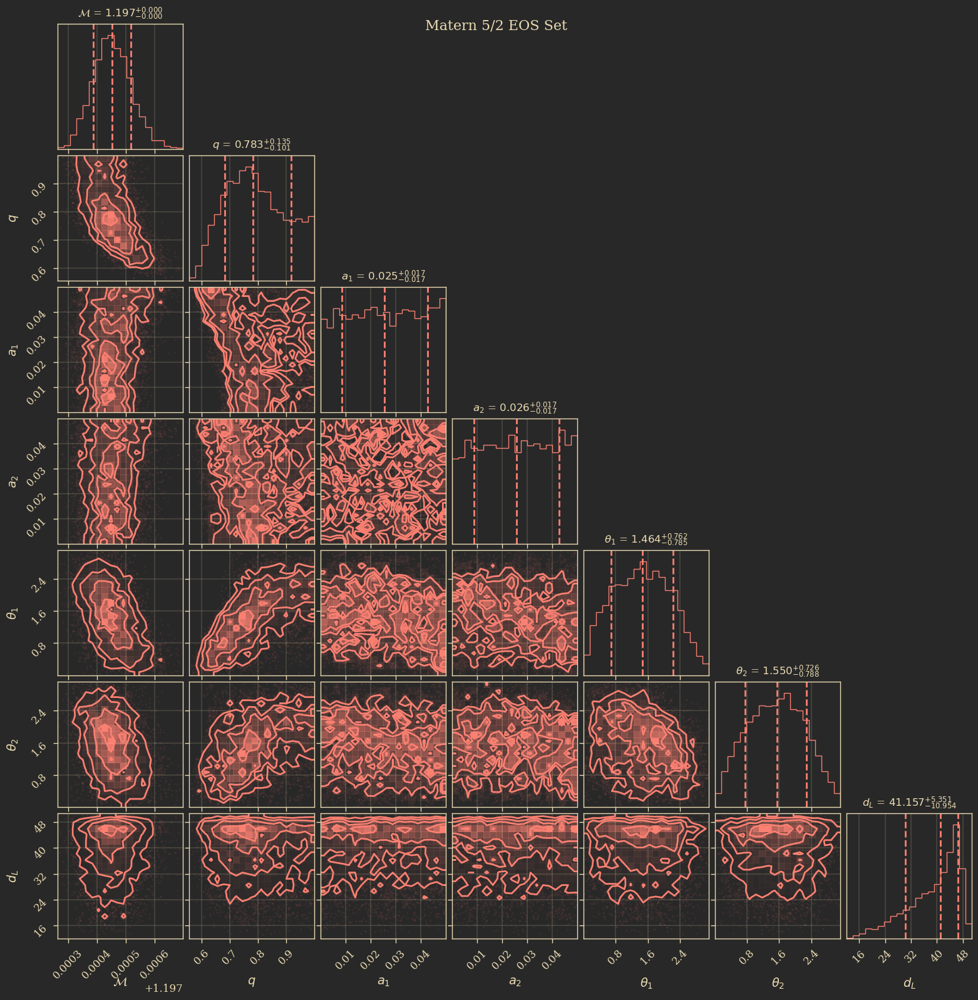

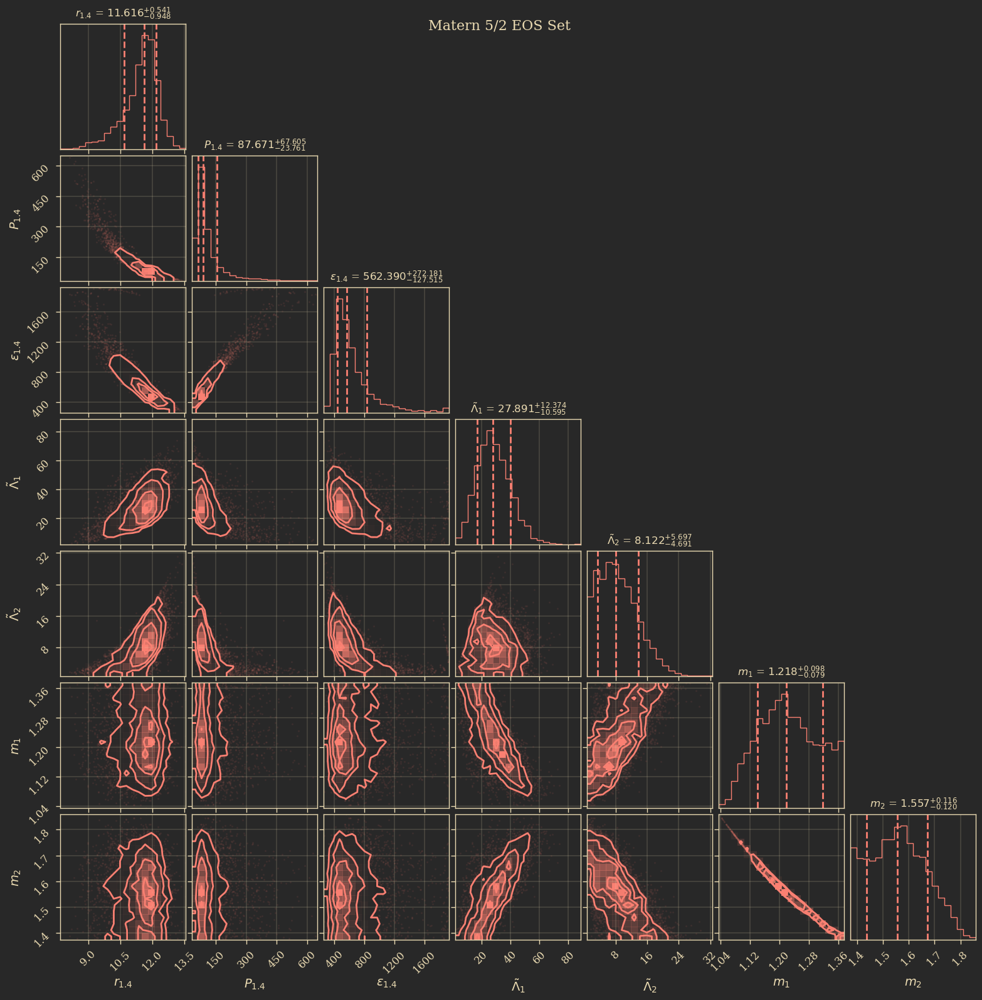

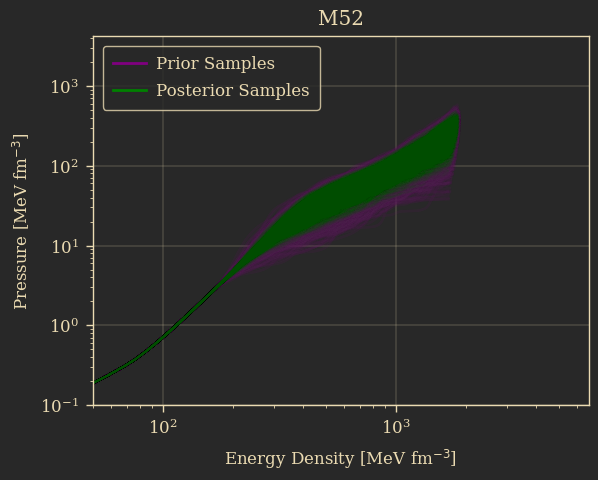

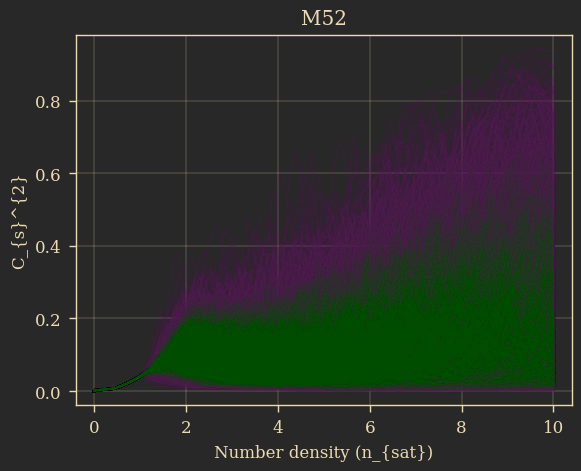

In [8]:
df_m52 = pa.load_results('M52_10ns_1')

params_to_plot = [
    "chirp_mass", "mass_ratio", "a_1", "a_2",
    "tilt_1", "tilt_2", "luminosity_distance",
]

labels = [
    r"$\mathcal{M}$", r"$q$", r"$a_1$", r"$a_2$",
    r"$\theta_1$", r"$\theta_2$", r"$d_L$"
]
theme.apply()
figure = corner.corner(
    df_m52[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Matern 5/2 EOS Set", fontsize=16)
plt.show()

params_to_plot = [
   "r_1.4", "pc_1.4", "ec_1.4", "tide1", "tide2", "m1", "m2"
]

labels = [
    r"$r_{1.4}$", r"$P_{1.4}$", r"$\epsilon_{1.4}$", r"$\tilde{\Lambda}_1$", r"$\tilde{\Lambda}_2$", r"$m_1$", r"$m_2$"
]

df_m52_clean = df_m52[params_to_plot].dropna()

theme.apply()
figure = corner.corner(
    df_m52_clean[params_to_plot],
    labels=labels,
    color='salmon',
    show_titles=True,
    title_kwargs={"fontsize": 12},
    quantiles=[0.16, 0.5, 0.84],
    title_fmt=".3f",
    label_kwargs={"fontsize": 14}
)
plt.suptitle("Matern 5/2 EOS Set", fontsize=16)
plt.show()

eos_m52, mr_m52 = pa.load_eos_data('M52_10ns_1')

num_eos = 2000
theme.apply()
for i in range(num_eos):
    plt.plot(eos_m52[0][i], eos_m52[1][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_m52["EOS"]:
        plt.plot(eos_m52[0][i], eos_m52[1][i], color='green', alpha=0.02)

legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]

plt.legend(handles=legend_handles, loc='upper left')
plt.yscale("log")
plt.xscale("log")
plt.xlabel(r"Energy Density [MeV fm$^{-3}$]")
plt.ylabel(r"Pressure [MeV fm$^{-3}$]")
plt.title(r"M52")
plt.xlim(50,)
plt.ylim(1e-1,)
theme.apply_transforms()
plt.show()


n = anal.get_n_test(10, 200)
for i in range(num_eos):
    plt.plot(n, eos_m52[2][i], color='purple', alpha=0.1)
for i in range(num_eos):
    if i in df_m52["EOS"]:
        plt.plot(n, eos_m52[2][i], color='green', alpha=0.02)
legend_handles = [
    Line2D([0], [0], color='purple', lw=2, label='Prior Samples'),
    Line2D([0], [0], color='green', lw=2, label='Posterior Samples')
]
plt.xlabel(r"Number density (n_{sat})")
plt.ylabel(r"C_{s}^{2}")
plt.title(r"M52")
plt.show()
theme.apply_transforms()

# get lambda tilde

In [3]:
m = mr_se[1]
tide = mr_se[2]

valid_eos = pa.get_valid_eos(df_se)
m_from_valid_eos = m[valid_eos]
tide_from_valid_eos = tide[valid_eos]

tide1 = np.zeros_like(df_se['m1'])
tide2 = np.zeros_like(df_se['m2'])

for i in range(len(m)):
    valid_mask = ~np.isnan(m[i]) # unstable branch has NaN mass
    m_valid = m[i][valid_mask]
    tide_valid = tide[i][valid_mask]
    
    if (len(m_valid) > 1 
        and (np.min(m_valid) <= 1.4 <= np.max(m_valid) or np.max(m_valid) <= 1.4 <= np.min(m_valid))
        and i in valid_eos):  # if eos reaches 1.4
        idx = df_se.index[df_se['EOS'] == i][0]
        m1val = df_se['m1'][idx]
        tide1[idx] = np.interp(df_se['m1'][idx], m_valid, tide_valid)
        tide2[idx] = np.interp(df_se['m2'][idx], m_valid, tide_valid)


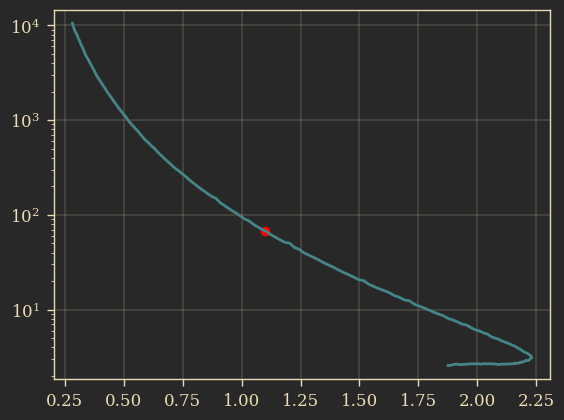

In [4]:
i = valid_eos[-1]

valid_mask = ~np.isnan(m[i]) # unstable branch has NaN mass
m_valid = m[i][valid_mask]
tide_valid = tide[i][valid_mask]

if (len(m_valid) > 1 
    and (np.min(m_valid) <= 1.4 <= np.max(m_valid) or np.max(m_valid) <= 1.4 <= np.min(m_valid))
    and i in valid_eos):  # if eos reaches 1.4
    idx = df_se.index[df_se['EOS'] == i][0]
    m1val = df_se['m1'][idx]
    tide1 = np.interp(df_se['m1'][idx], m_valid, tide_valid)
    tide2 = np.interp(df_se['m2'][idx], m_valid, tide_valid)


plt.plot(m_valid, tide_valid)
plt.scatter(m1val, tide1, color='red', label='m1')
plt.yscale('log')
plt.show()

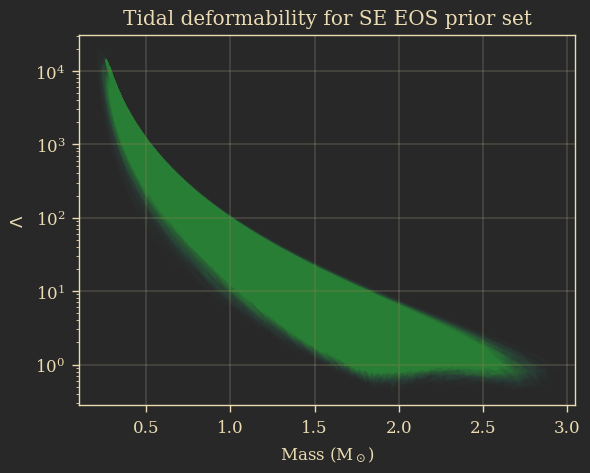

In [6]:
for i in range(len(m)):
    plt.plot(m[i], tide[i], color='#4ad389', alpha=0.01)


plt.yscale('log')
plt.xlabel('Mass (M$_\odot$)')
plt.ylabel(r"${\Lambda}$")
plt.title('Tidal deformability for SE EOS prior set')
plt.show()